# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [1]:
from utils import get_dataset
import numpy
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

%matplotlib inline

In [2]:
# Get data set from processed tfrecord files
dataset = get_dataset('/home/workspace/data/waymo/train/*.tfrecord')

INFO:tensorflow:Reading unweighted datasets: ['/data/waymo/processed/*.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['/data/waymo/processed/*.tfrecord']
INFO:tensorflow:Number of filenames to read: 100
Instructions for updating:
Use `tf.data.Dataset.interleave(map_func, cycle_length, block_length, num_parallel_calls=tf.data.AUTOTUNE)` instead. If sloppy execution is desired, use `tf.data.Options.experimental_deterministic`.
Instructions for updating:
Use `tf.data.Dataset.map()


## Write a function to display an image and the bounding boxes

Implement the `display_instances` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [3]:
def display_instances(batch):
    """
    This function takes a batch from the dataset and display the image with 
    the associated bounding boxes.
    """
    color_map = {1: 'red', 2: 'blue', 4: 'green'}
    fig, ax = plt.subplots(figsize=(15,15))
    ax.axis('off')
    image = batch['image'].numpy()
    ax.imshow(image)
    height, width = image.shape[:2]
    boxes = batch['groundtruth_boxes'].numpy()
    classes = batch['groundtruth_classes'].numpy()
    for bbox, cl in zip(boxes, classes):
        y1, x1, y2, x2 = bbox
        y1 *= height
        x1 *= width
        y2 *= height
        x2 *= width
        
        bb_width = x2 - x1
        bb_height = y2 - y1
        box = Rectangle((x1, y1), x2-x1, y2-y1, facecolor='none', edgecolor=color_map[cl])
        ax.add_patch(box)
        
    plt.show()
    
    return

## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

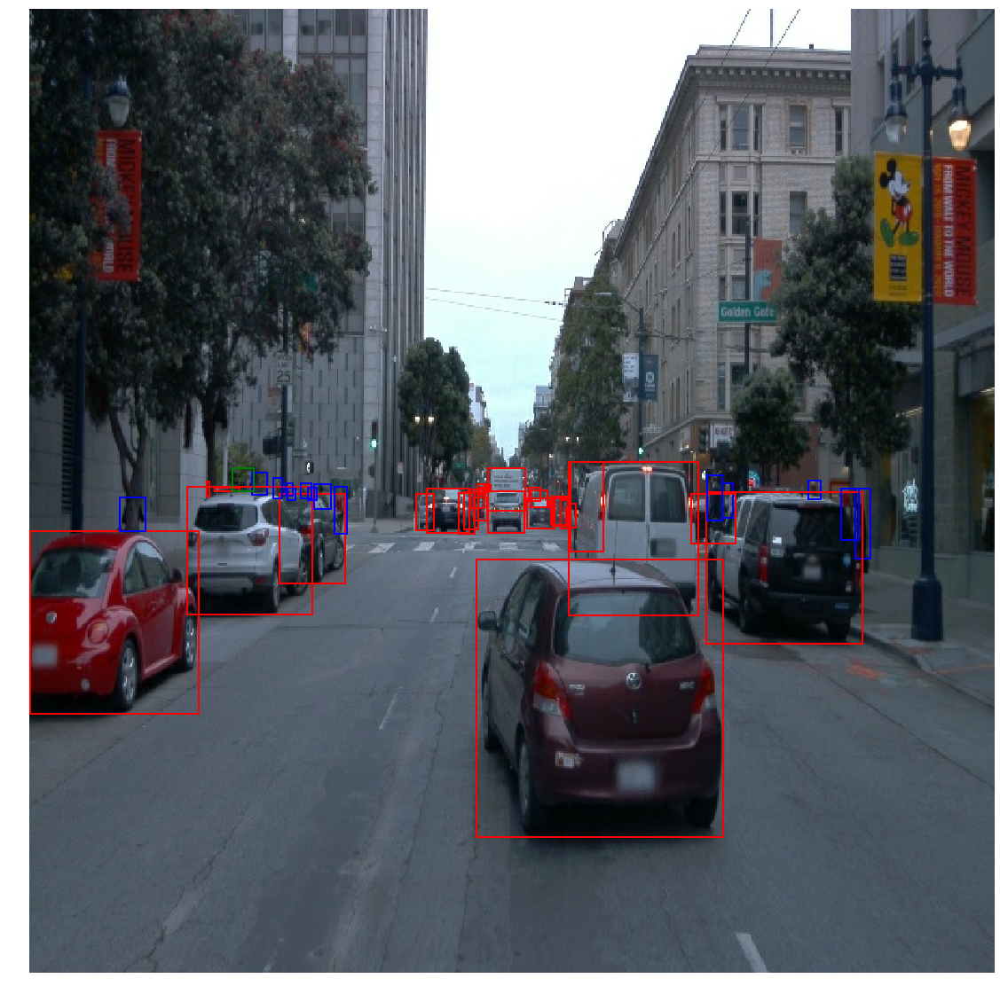

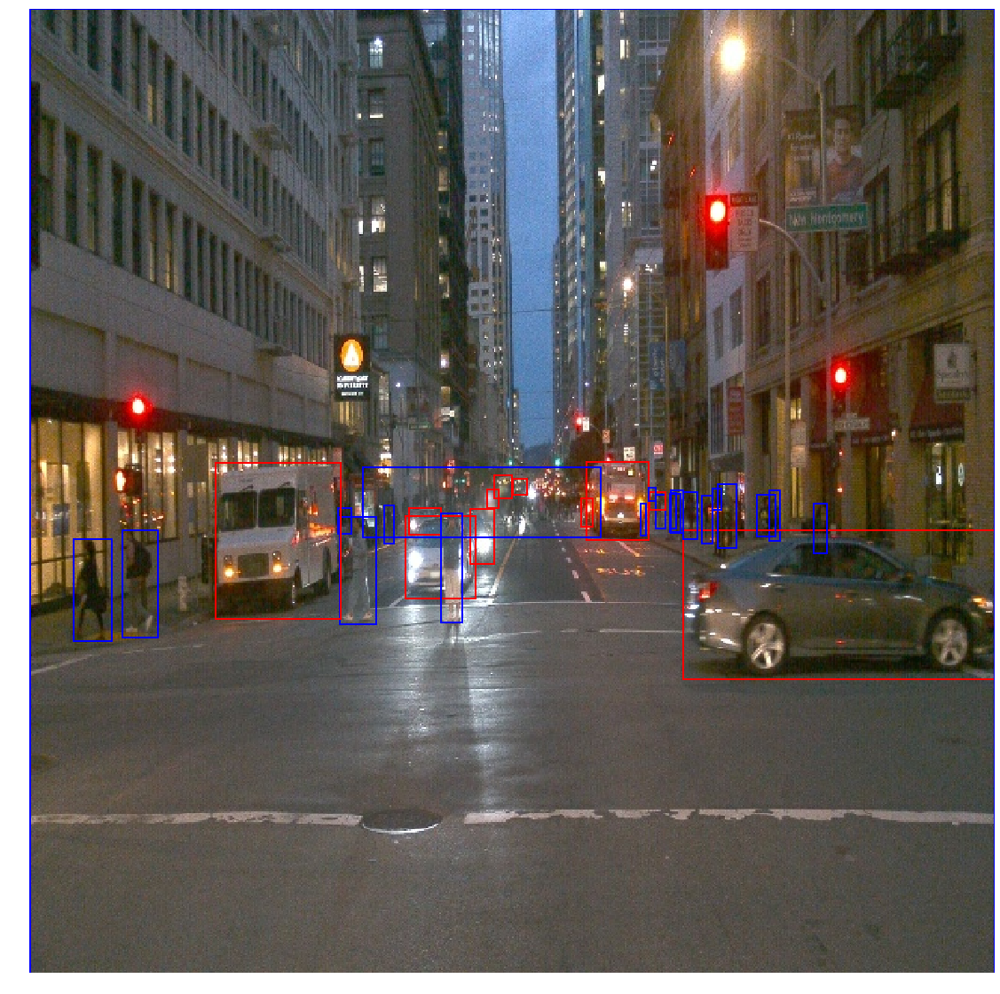

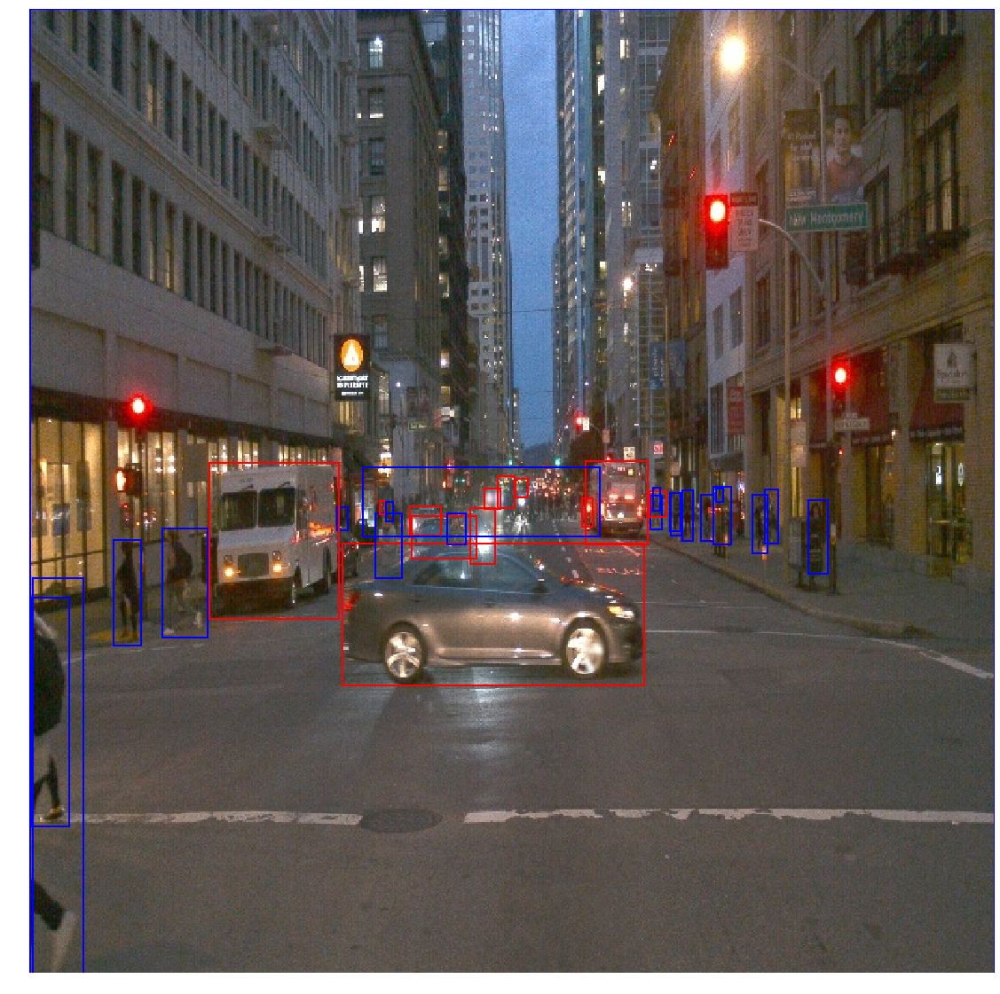

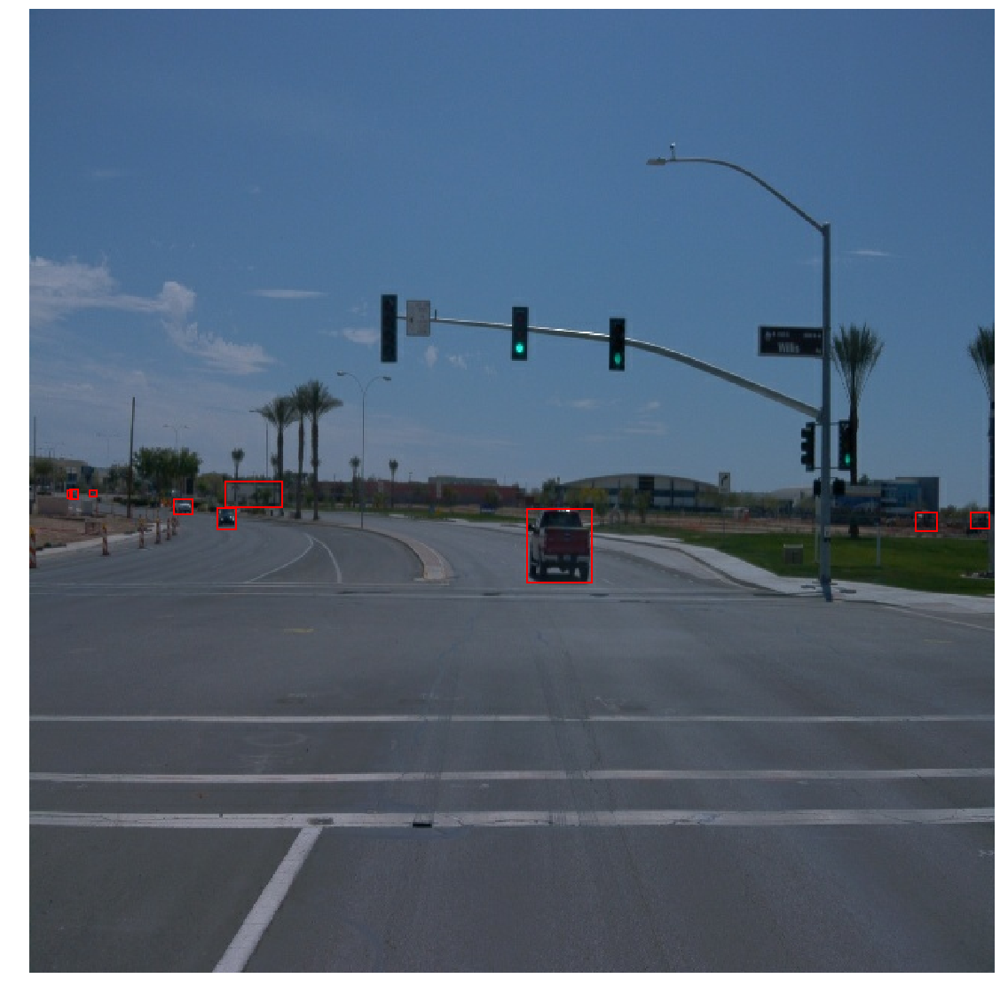

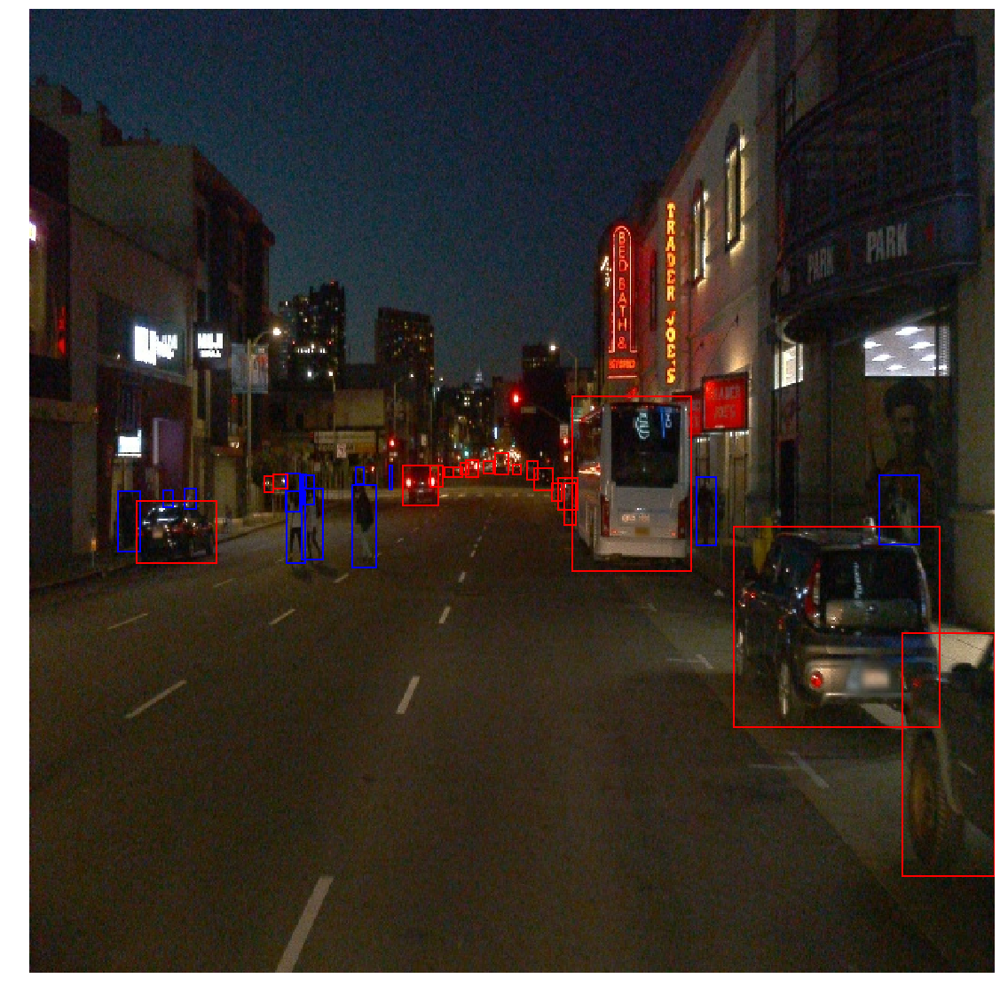

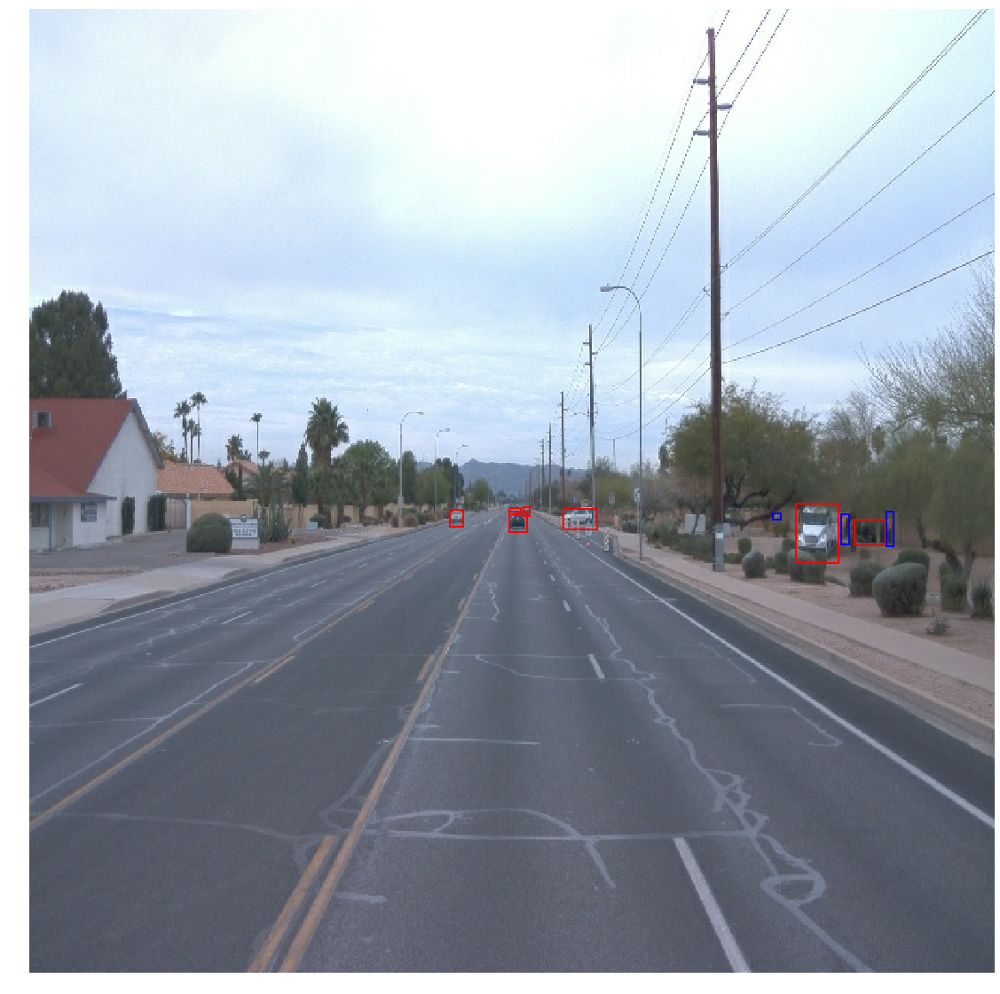

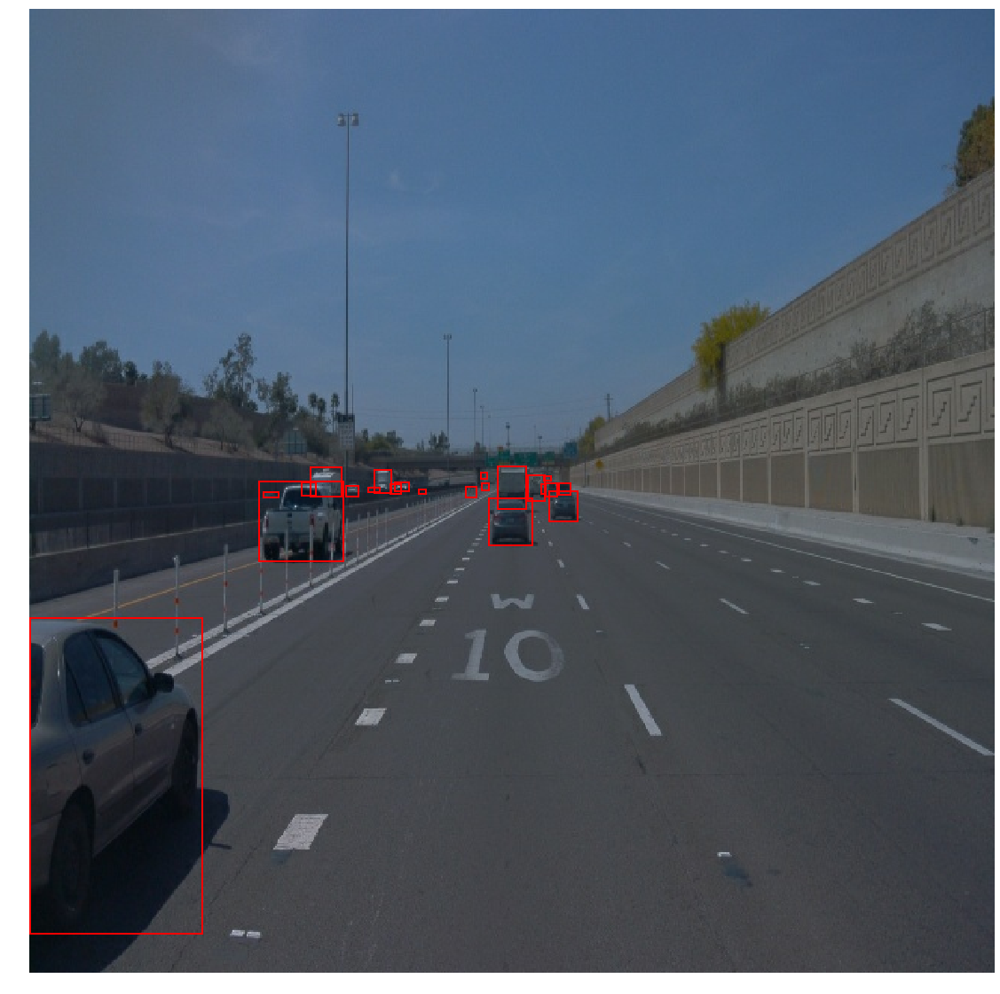

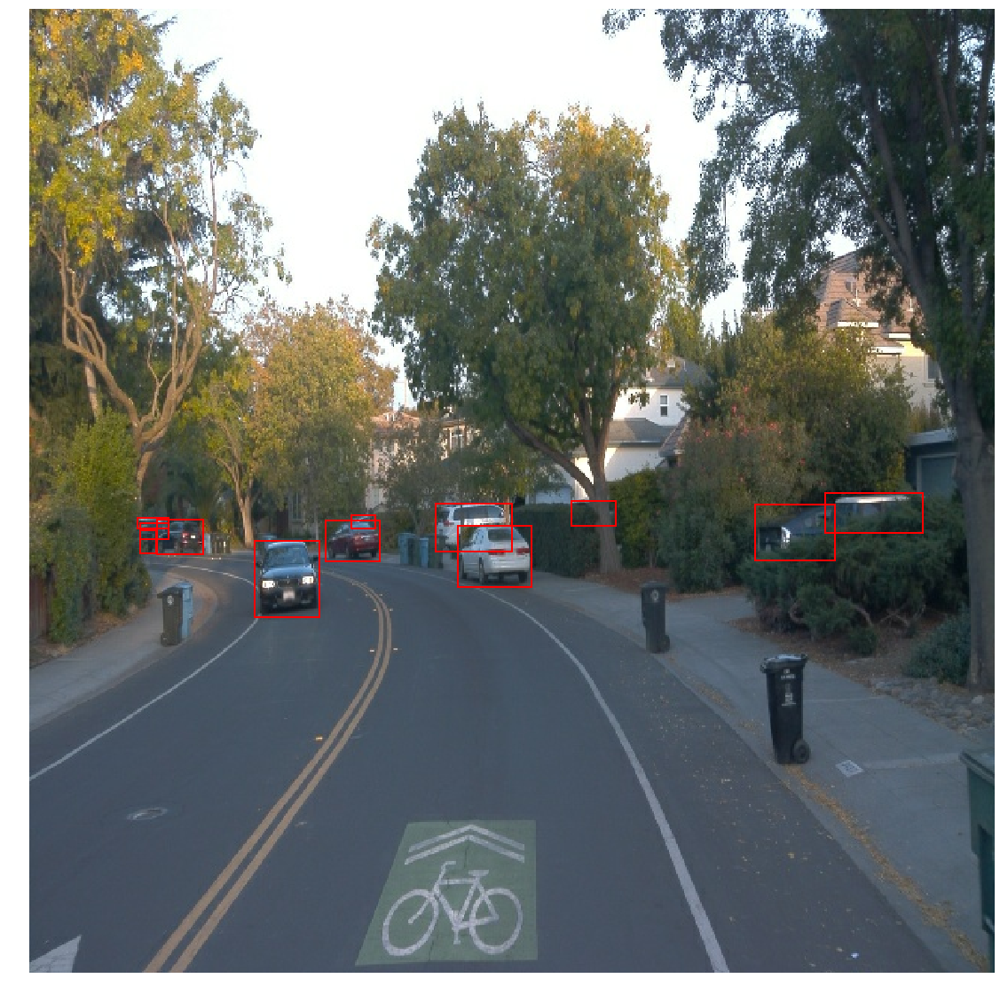

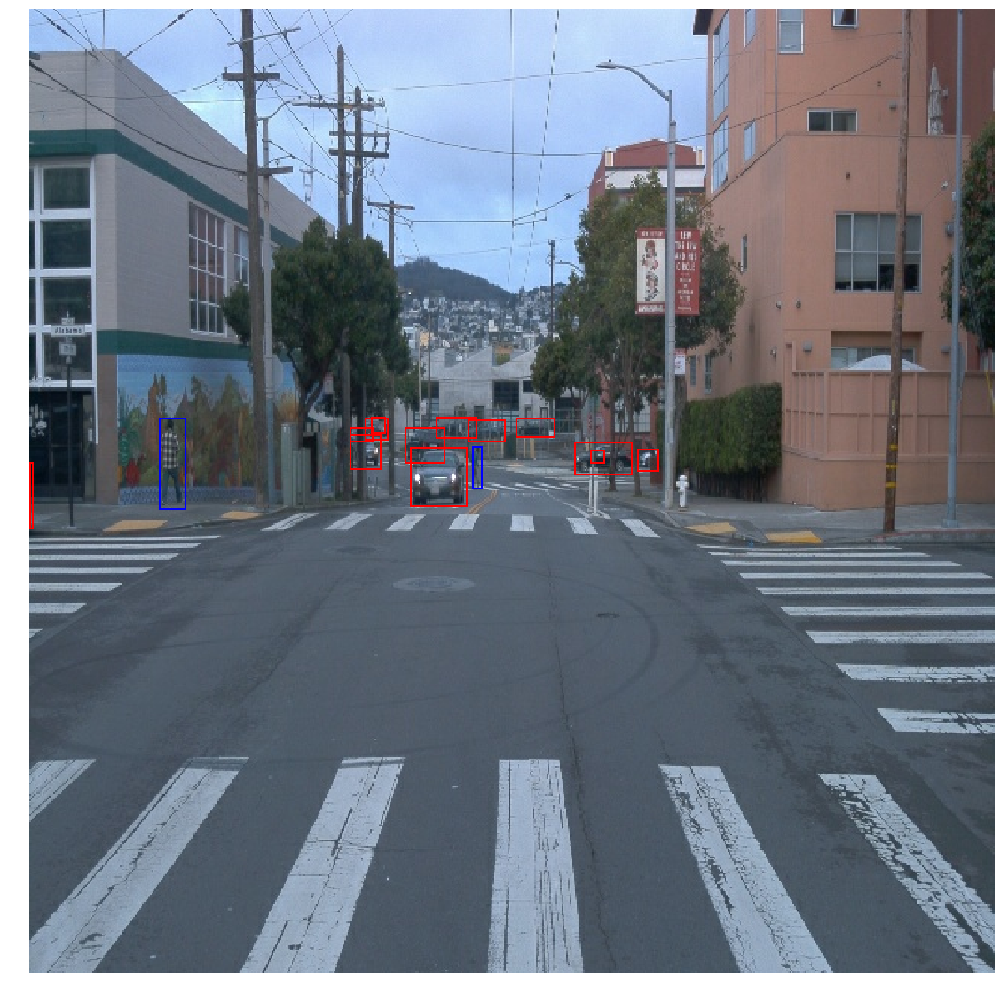

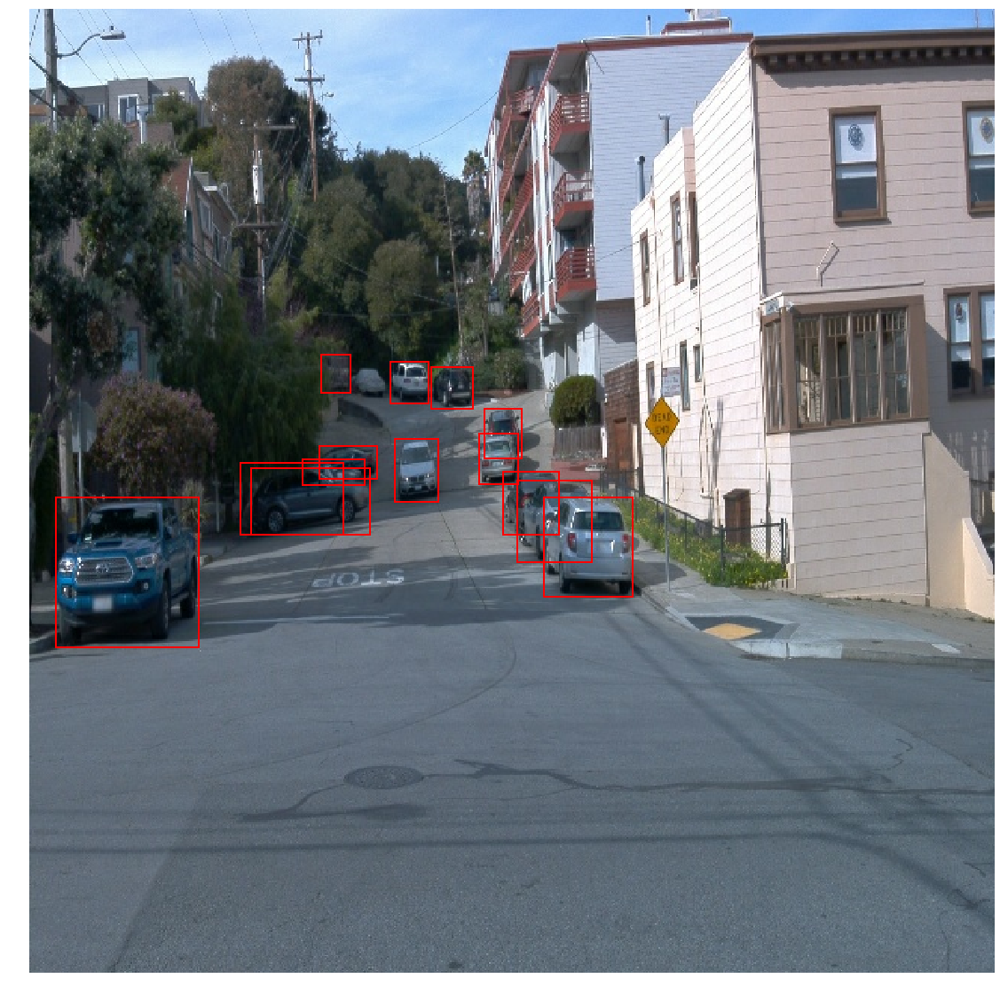

In [4]:
dataset.shuffle(100)

for batch in dataset.take(5):
    display_instances(batch)

## Additional EDA

In this last part, you are free to perform any additional analysis of the dataset. What else would like to know about the data?
For example, think about data distribution. So far, you have only looked at a single file...

### Collect addtional information

In [5]:
# Use TFRecordDataset to get the dataset from processed files.
# Should not use provided get_dataset function in this case.

import glob
import sys
import tensorflow as tf

def dataset_analysis(record):
    return tf.io.parse_single_example(
        record,

      
      {
       "image/height": tf.io.FixedLenFeature([], tf.int64, default_value=0),
       "image/width": tf.io.FixedLenFeature([], tf.int64, default_value=0),
       "image/filename": tf.io.FixedLenFeature([], tf.string, default_value=""),
       "image/source_id": tf.io.FixedLenFeature([], tf.string, default_value=""),
       "image/encoded": tf.io.FixedLenFeature([], tf.string, default_value=""),
       "image/format": tf.io.FixedLenFeature([], tf.string, default_value=""),
       "image/object/bbox/xmin": tf.io.VarLenFeature(tf.float32),
       "image/object/bbox/xmax": tf.io.VarLenFeature(tf.float32),
       "image/object/bbox/ymin": tf.io.VarLenFeature(tf.float32),
       "image/object/bbox/ymax": tf.io.VarLenFeature(tf.float32),
       "image/object/class/text": tf.io.VarLenFeature(tf.string),
       "image/object/class/label": tf.io.VarLenFeature(tf.int64)
      }
    )

dataset = tf.data.TFRecordDataset(glob.glob('/home/workspace/data/waymo/processed/*.tfrecord')).map(dataset_analysis)

class_count = {1: 0, 2 : 0, 4: 0}
class_dist = {1:[], 2:[], 4:[], 'total':[]}
min_all = sys.maxsize
min_all_batch = None
max_all = -1
max_all_batch = None
min_vehicle = sys.maxsize
min_vehicle_batch = None
max_vehicle = -1
max_vehicle_batch = None
min_pedestrian = sys.maxsize
min_pedestrian_batch = None
max_pedestrian = -1
max_pedestrian_batch = None
min_cyclist = sys.maxsize
min_cyclist_batch = None
max_cyclist = -1
max_cyclist_batch = None

for batch in processed_dataset.take(-1):
    count = {1: 0, 2 : 0, 4: 0 }
    total = 0
    for cl in tf.sparse.to_dense(batch["image/object/class/label"]).numpy():
        total += 1
        class_count[cl] += 1
        count[cl] += 1
    class_dist[1].append(count[1])
    class_dist[2].append(count[2])
    class_dist[4].append(count[4])
    class_dist['total'].append(total)
    
    if total < min_all:
        min_all = total
        min_all_batch = batch
    if total > max_all:
        max_all = total
        max_all_batch = batch
    if count[1] < min_vehicle:
        min_vehicle = count[1]
        min_vehicle_batch = batch
    if count[1] > max_vehicle:
        max_vehicle = count[1]
        max_vehicle_batch = batch
    if count[2] < min_pedestrian:
        min_pedestrian = count[2]
        min_pedestrian_batch = batch
    if count[2] > max_pedestrian:
        max_pedestrian = count[2]
        max_pedestrian_batch = batch
    if count[4] < min_cyclist:
        min_cyclist = count[4]
        min_cyclist_batch = batch
    if count[4] > max_cyclist:
        max_cyclist = count[4]
        max_cyclist_batch = batch

### Number of batches in the dataset
This information let us know how much data we have and how to split the data set.

In [6]:
print(f'The number of images in the dataset is {len(class_dist[1])}.')

We have 19803 images in the dataset.


### Classes distribution in the dataset

In [1]:
class_names = {1: 'vehicle', 2: 'pedestrian', 4: 'cyclist'}
colors = ['red', 'blue', 'green']
total_object = sum(class_count.values())
plt.bar([class_names[cl] for cl in class_count.keys()], class_count.values(), color=['red', 'blue', 'green'])

NameError: name 'class_count' is not defined

In [2]:
print(f'The total number of objects in the dataset is {total_object}. They include:')
print(f'- {class_count[1]} vehicles ({class_count[1] * 100 / total_object:.2f}%)')
print(f'- {class_count[2]} pedestrians ({class_count[2] * 100 / total_object:.2f}%)')
print(f'- {class_count[4]} cyclists ({class_count[4] * 100 / total_object:.2f}%)')

NameError: name 'total_object' is not defined

- The classes are highly imbalanced. There are a lot of vehicles and very few cyclists.
- The model may struggle when detecting cyclists.

### Classes distribution in each batch

**Number of vehicles in each image**

In [3]:
imn, bins, patches = plt.hist(class_dist[1], max_vehicle, facecolor='red')
plt.xlabel('Number of vehicles')
plt.ylabel('Number of images')
plt.show()
print(f'Minimum number of vehicles in an image: {min_vehicle}')
print(f'Maximum number of vehicles in an image: {max_vehicle}')

NameError: name 'plt' is not defined

**Number of pedestrians in each image**

In [4]:
imn, bins, patches = plt.hist(class_dist[2], max_pedestrian, facecolor='blue')
plt.xlabel('Number of pedestrians')
plt.ylabel('Number of images')
plt.show()
print(f'Minimum number of pedestrians in an image: {min_pedestrian}')
print(f'Maximum number of pedestrians in an image: {max_pedestrian}')

NameError: name 'plt' is not defined

**Number of cyclists in each image**

In [5]:
imn, bins, patches = plt.hist(class_dist[4], max_cyclist, facecolor='green')
plt.xlabel('Number of cyclists')
plt.ylabel('Number of images')
plt.show()
print(f'Minimum number of cyclists in an image: {min_cyclist}')
print(f'Maximum number of cyclisst in an image: {max_cyclist}')

NameError: name 'plt' is not defined

**Number of labeled objects (vehicles, pedestrians and cyclists) in each image**

In [6]:
imn, bins, patches = plt.hist(class_dist['total'], max_all, facecolor='grey')
plt.xlabel('Number of objects')
plt.ylabel('Number of images')
plt.show()
print(f'Minimum number of all objects in an image: {min_all}')
print(f'Maximum number of all objects in an image: {max_all}')

NameError: name 'plt' is not defined

### Display images that have minimum/maximum number of objects in each batch
When iterate the dataset only **first image** with minimum/maximum number of objects will be kept for later display.

In [8]:
def display_image(batch, title):
    """
    This function takes a batch and display the image with the associated bounding boxes.
    """
    color_map = {1: 'red', 2: 'blue', 4: 'green'}
    # Init plot
    fig, ax = plt.subplots(figsize=(20, 20))
    ax.axis('off')
    ax.set_title(title)
    
    # Add image
    image = tf.io.decode_jpeg(batch["image/encoded"])
    ax.imshow(image)
    
    # Add bounding boxes
    height, width = image.shape[:2]
    boxes_x1 = tf.sparse.to_dense(batch["image/object/bbox/xmin"]).numpy()
    boxes_x2 = tf.sparse.to_dense(batch["image/object/bbox/xmax"]).numpy()
    boxes_y1 = tf.sparse.to_dense(batch["image/object/bbox/ymin"]).numpy()
    boxes_y2 = tf.sparse.to_dense(batch["image/object/bbox/ymax"]).numpy()
    classes = tf.sparse.to_dense(batch["image/object/class/label"]).numpy()
    for x1, x2, y1, y2, cl in zip(boxes_x1, boxes_x2, boxes_y1, boxes_y2, classes):
        x1 *= width
        x2 *= width
        y1 *= height
        y2 *= height
        
        bb_width = x2 - x1
        bb_height = y2 - y1
        box = Rectangle((x1, y1), x2 - x1, y2 - y1, facecolor='none', edgecolor=color_map[cl], linewidth=2)
        ax.add_patch(box)
    
    # Show plot
    plt.show()

In [9]:
display_image(min_vehicle_batch, f'Image with minimum number of vehicles ({min_vehicle})')

NameError: name 'min_vehicle_batch' is not defined

In [10]:
display_image(max_vehicle_batch, f'Image with maximum number of vehicles ({max_vehicle})')

NameError: name 'max_vehicle_batch' is not defined

In [11]:
display_image(min_pedestrian_batch, f'Image with minimum number of pedestrians ({min_pedestrian})')

NameError: name 'min_pedestrian_batch' is not defined

In [12]:
display_image(max_pedestrian_batch, f'Image with maximum number of pedestrians ({max_pedestrian})')

NameError: name 'max_pedestrian_batch' is not defined

In [13]:
display_image(min_cyclist_batch, f'Image with minimum number of cyclists ({min_cyclist})')

NameError: name 'min_cyclist_batch' is not defined

In [14]:
display_image(max_cyclist_batch, f'Image with maximum number of cyclists ({max_cyclist})')

NameError: name 'max_cyclist_batch' is not defined

In [15]:
display_image(min_all_batch, f'Image with minimum number of objects ({min_all})')

NameError: name 'min_all_batch' is not defined

In [16]:
display_image(max_all_batch, f'Image with maximum number of objects ({max_all})')

NameError: name 'max_all_batch' is not defined

### Conclusion
1. Our dataset is small. We only have **19803 batch** with **458997 labeled objects**.
2. Dataset is highly imbalanced. Especially, there are very few labeled cycists.
3. There are images with no labeled object (vehicle, pedestrian and cyclist).
4. There are no more than 67 vehicles, 44 pedestrian, 6 cyclists and 77 objects in each image.